In [1]:
! pip install torch_geometric torchviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.6/661.6 kB 7.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.3.1-py3-none-any.whl size=910454 sha256=8c5fa6bb9abd8d761368120c8aa7baada8bea0092dc1610d1a2c9e8fb4d35614
  Stored in directory: /root/.cache/pip/wheels/ac/dc/30/e2874821ff308ee67dcd7a66dbde912411e19e35a1addda028
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4130 sha256=0bf8e6ddb83dac525490303199ce741b1b51628f18bbd4ccb9dba8965980e6b3
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torch_geometric torchviz


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! if ! [ -d data ]; then cp -r drive/MyDrive/HPCDATA/data .; fi
! if ! [ -d utils ]; then cp -r drive/MyDrive/HPCDATA/utils .; fi

In [4]:
import itertools
import json
import logging
import os
import shutil
from timeit import default_timer

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import torch_geometric.nn as gnn
from sklearn.metrics import auc, roc_curve
from torch import nn
from torch_geometric.data import Data, HeteroData
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GCNConv, HeteroConv
from torchviz import make_dot
from sklearn.metrics import (auc, roc_curve, confusion_matrix,
                             ConfusionMatrixDisplay, classification_report,
                             precision_recall_curve)
from utils.data_processing import *
from utils.training_multigraph import *
from utils.plotting import *

from tqdm.notebook import tqdm

In [5]:
AGGREGATED_METRICS_PATH = "data/aggregated/"
JOB_TABLE_PATH = 'data/job_table.parquet'
RACKS_DATA_PATH = 'data/racks_spatial_distribution.json'
DROP_TH = 100
KEEPRACKS = np.arange(23,28)
KEEPNODES = np.arange(460,559).astype(str) # set it no None if you don't want to filter nodes
KEEPNODES = KEEPNODES[KEEPNODES!='537']

array(['460', '461', '462', '463', '464', '465', '466', '467', '468',
       '469', '470', '471', '472', '473', '474', '475', '476', '477',
       '478', '479', '480', '481', '482', '483', '484', '485', '486',
       '487', '488', '489', '490', '491', '492', '493', '494', '495',
       '496', '497', '498', '499', '500', '501', '502', '503', '504',
       '505', '506', '507', '508', '509', '510', '511', '512', '513',
       '514', '515', '516', '517', '518', '519', '520', '521', '522',
       '523', '524', '525', '526', '527', '528', '529', '530', '531',
       '532', '533', '534', '535', '536', '538', '539', '540', '541',
       '542', '543', '544', '545', '546', '547', '548', '549', '550',
       '551', '552', '553', '554', '555', '556', '557', '558'],
      dtype='<U21')

## Read and process metrics table

In [6]:
data = load_metrics(AGGREGATED_METRICS_PATH,racks=KEEPRACKS)
data = process_metrics(data,KEEPNODES,DROP_TH)
data.head()

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

,timestamp,460,461,463,464,465,467,468,469,470,...,551,552,553,554,555,556,557,558,values,anomalies
0,2022-03-31 02:45:00+00:00,"[0.539976015665201, 0.5405405022263785, 0.5315...","[0.3955845662662844, 0.40540536593020815, 0.37...","[0.4160699413210467, 0.43243241037276337, 0.38...","[0.46081933488446114, 0.47747745580482015, 0.4...","[0.4759347584335139, 0.48648649925787385, 0.45...","[0.5871120678300974, 0.6036036345645427, 0.576...","[0.5280428440482905, 0.5495495456794321, 0.504...","[0.5684167170740713, 0.5945945911114889, 0.540...","[0.612370456611576, 0.6216216355540441, 0.6036...",...,"[0.6630866180691942, 0.6756756385225489, 0.657...","[0.7486076813237196, 0.7477477283971609, 0.747...","[0.7484088436863042, 0.7477477283971609, 0.756...","[0.7758549927365993, 0.7837838162927697, 0.783...","[0.8110581160655834, 0.8108107748187192, 0.819...","[0.7800315542463185, 0.7837838162927697, 0.783...","[0.8337308265224157, 0.8378378192612744, 0.837...","[25.564450412326387, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
1,2022-03-31 03:00:00+00:00,"[0.5129274204992378, 0.5045045002473754, 0.522...","[0.3570007782344892, 0.3513513629617035, 0.360...","[0.3747015766319405, 0.36936936395120507, 0.37...","[0.41865537686469456, 0.4144144093832618, 0.42...","[0.4331741661110016, 0.4234234528363155, 0.432...","[0.5624501919608657, 0.5585585891324859, 0.558...","[0.49602203334669837, 0.4954954567943217, 0.49...","[0.5397770566372865, 0.5495495456794321, 0.531...","[0.590095239343826, 0.5855855476584353, 0.5945...",...,"[0.6591088941968907, 0.6666666809861009, 0.639...","[0.7482098846583893, 0.7477477283971609, 0.738...","[0.749403031873382, 0.7477477283971609, 0.7567...","[0.7750595207964381, 0.7747747728397161, 0.774...","[0.810262401344424, 0.8108107748187192, 0.8108...","[0.7800316756368176, 0.7837838162927697, 0.783...","[0.832338720279509, 0.8378378192612744, 0.8378...","[25.533336046006944, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
2,2022-03-31 03:15:00+00:00,"[0.5151152414633041, 0.5045045002473754, 0.522...","[0.360381867804047, 0.3513513629617035, 0.3603...","[0.37708811384292334, 0.3783784074042587, 0.37...","[0.4196496864422715, 0.4234234528363155, 0.423...","[0.4321796744476762, 0.43243241037276337, 0.43...","[0.5626489689030316, 0.5675675466689337, 0.558...","[0.492442227530224, 0.4954954567943217, 0.4774...","[0.5385837880317951, 0.5495495456794321, 0.522...","[0.5922830603078925, 0.6036036345645427, 0.594...",...,"[0.649562259790963, 0.6576576375330473, 0.6306...","[0.7400557206668658, 0.7387387708607129, 0.738...","[0.7420443398220197, 0.7387387708607129, 0.747...","[0.7690928135974837, 0.7657657293866624, 0.774...","[0.8062846774721205, 0.8018018172822713, 0.810...","[0.7746619669121062, 0.7747747728397161, 0.774...","[0.8287589144630344, 0.8198198182717729, 0.837...","[25.457777235243057, 25.600000381469727, 25.20...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
3,2022-03-31 03:30:00+00:00,"[0.5079552656588584, 0.5045045002473754, 0.513...","[0.3534208510275159, 0.3513513629617035, 0.360...","[0.3729116130284538, 0.3783784074042587, 0.378...","[0.4188542751973597, 0.4234234528363155, 0.414...","[0.4349641904097378, 0.45045041136226494, 0.43...","[0.5670245501359148, 0.5675675466689337, 0.558...","[0.4996021426394202, 0.5135135437004291, 0.495...","[0.5459426014736564, 0.5585585891324859, 0.540...","[0.5956641498774502, 0.5945945911114889, 0.594...",...,"[0.6549322719919222, 0.6666666809861009, 0.648...","[0.7452264703636629, 0.7477477283971609, 0.747...","[0.7452264703636629, 0.7387387708607129, 0.756...","[0.7716784312268805, 0.7657657293866624, 0.774...","[0.8080744589898586, 0.8018018172822713, 0.810...","[0.777843733282252, 0.7747747728397161, 0.7837...","[0.8311456944550154, 0.8288


## Read Jobs and Racks Tables

In [7]:
node_columns = data.columns[1:-3]
nodes = list(node_columns.astype(int))

racks = pd.read_json(RACKS_DATA_PATH)

jobtable = pd.read_parquet(JOB_TABLE_PATH)[['start_time','end_time','nodes']]
jobtable = jobtable.dropna(subset=['nodes'])
jobtable.nodes = jobtable.nodes.map(lambda x:np.fromstring(x.strip(']['),dtype=int,sep=',')) # map nodelist from str to array
jobtable.nodes = jobtable.nodes.map(lambda a : np.intersect1d(a,nodes)) # Keep only jobs where the selected nodes appear
jobtable = jobtable[jobtable.nodes.map(len)>0] # Drop rows without any node of interest
jobtable = jobtable.reset_index() # Not really necessary, but meh
print("Data covering the period from {} to {}".format(jobtable.start_time.min().date(),jobtable.end_time.max().date()))
jobtable.head()

Data covering the period from 2022-03-31 to 2022-04-30


,index,start_time,end_time,nodes
0,19,2022-04-02 05:36:25+00:00,2022-04-02 13:23:12+00:00,"[529, 530, 531, 532, 533, 534, 535, 536]"
1,780,2022-04-01 23:28:45+00:00,2022-04-01 23:29:22+00:00,"[467, 493, 494, 495, 512, 513, 514]"
2,2096,2022-04-02 16:09:02+00:00,2022-04-02 16:11:31+00:00,"[474, 491, 512, 536, 552]"
3,2953,2022-04-08 22:16:15+00:00,2022-04-09 05:46:26+00:00,"[463, 464, 488, 489, 507, 512, 513, 522, 542]"
4,3015,2022-04-09 06:01:58+00:00,2022-04-09 06:02:12+00:00,[464]


In [8]:
data_list = []
job_proximity = ('node', 'same_job', 'node')
node_proximity = ('node', 'same_rack', 'node')

node_columns = data.columns[1:-3]
num_nodes = len(node_columns)
num_node_features = data[node_columns[0]][0].shape[0]

# Build Node proximity graph (global and static)
racks = pd.read_json(RACKS_DATA_PATH)
edgelist_racks = get_edgelist_racks(racks,nodes).apply_(lambda x: nodes.index(x))
eweights_racks = torch.full((edgelist_racks.shape[1],),1.)

# Build Job proximity graphs and create data structures for training
for i,row in tqdm(data.iterrows(), total=len(data)):
  timestamp = row['timestamp']
  jobs = jobtable[(jobtable['start_time']<timestamp) & (jobtable['end_time']>timestamp)]

  edgelist_jobs,eweights_jobs = get_edgelist_jobs(jobs,nodes)

  graph = HeteroData()
  graph[job_proximity] = {
    'edge_index':edgelist_jobs,
    'edge_weight': eweights_jobs,
    }
  graph[node_proximity] = {
    'edge_index':edgelist_racks,
    'edge_weight': eweights_racks}

  graph['node'].num_nodes = num_nodes
  graph['node'].x = torch.tensor(np.stack(row.iloc[1:-2]),dtype = torch.float32)
  graph['node'].id = torch.tensor(nodes)
  data_list.append(graph)

  0%|          | 0/2963 [00:00<?, ?it/s]

## Model Definition

In [9]:
class MLP(nn.Module):
    def __init__(self,
                 input_dim,
                 output_dim,
                 hidden_dims = [],
                 activation=F.relu,
                 activate_last=True):
        super().__init__()

        last_hidden_dim = input_dim
        self.hidden_layers = nn.Sequential()
        for dim in hidden_dims:
            self.hidden_layers.append(nn.Linear(last_hidden_dim,dim))
            last_hidden_dim = dim

        self.activation = activation
        self.activate_last = activate_last

        self.output = nn.Linear(last_hidden_dim,output_dim)

    def forward(self,x):
        for layer in self.hidden_layers:
            x = layer(x)
            self.activation(x)

        x = self.output(x)
        if self.activate_last:
            x = self.activation(x)
        return x

class MultiGraphAnomalyPredictor(nn.Module):
    def __init__(self,
                 in_channels,
                 hidden_channels,
                 out_channels,
                 conv_layer=GCNConv,
                 agg = 'sum',
                 **conv_layer_kwargs):
        super().__init__()

        #encoder
        last_hidden_dim = in_channels
        convs = []
        for dim in hidden_channels:
            convs.append((conv_layer(last_hidden_dim, dim, **conv_layer_kwargs),'x,edge_index_jobs,eweight_jobs-> h_j'))
            convs.append((conv_layer(last_hidden_dim, dim, **conv_layer_kwargs),'x,edge_index_racks,eweight_racks-> h_r'))

            if agg == 'mlp':
                convs.append((lambda h_j,h_r:torch.cat((h_j,h_r),dim=1), 'h_j,h_r -> h_s'))
                convs.append((MLP(2*dim,dim),'h_s-> x'))
            elif agg == 'sum':
                convs.append((torch.add, 'h_j,h_r -> x'))
            elif agg == 'mean':
                convs.append((lambda h_j,h_r: (h_j + h_r)/2, 'h_j,h_r -> x'))
            else:
                raise ValueError(f'aggregation type {agg} not supported')
            last_hidden_dim = dim

        self.convs = gnn.Sequential('x,edge_index_jobs, edge_index_racks,eweight_jobs,eweight_racks',convs)
        self.out_layers = MLP(last_hidden_dim,1,out_channels,activate_last=False)


    def forward(self,
                x,
                edge_index_jobs,
                edge_index_racks,
                eweight_jobs=None,
                eweight_racks=None):

        x = self.convs(x,edge_index_jobs,edge_index_racks,eweight_jobs,eweight_racks)
        x = self.out_layers(x)
        return x

convs.module_0.bias torch.Size([300]) 300
convs.module_0.lin.weight torch.Size([300, 416]) 124800
convs.module_1.bias torch.Size([300]) 300
convs.module_1.lin.weight torch.Size([300, 416]) 124800
convs.module_3.output.weight torch.Size([300, 600]) 180000
convs.module_3.output.bias torch.Size([300]) 300
convs.module_4.bias torch.Size([100]) 100
convs.module_4.lin.weight torch.Size([100, 300]) 30000
convs.module_5.bias torch.Size([100]) 100
convs.module_5.lin.weight torch.Size([100, 300]) 30000
convs.module_7.output.weight torch.Size([100, 200]) 20000
convs.module_7.output.bias torch.Size([100]) 100
out_layers.hidden_layers.0.weight torch.Size([16, 100]) 1600
out_layers.hidden_layers.0.bias torch.Size([16]) 16
out_layers.hidden_layers.1.weight torch.Size([1, 16]) 16
out_layers.hidden_layers.1.bias torch.Size([1]) 1
out_layers.output.weight torch.Size([1, 1]) 1
out_layers.output.bias torch.Size([1]) 1
Total trainable Params: 512435


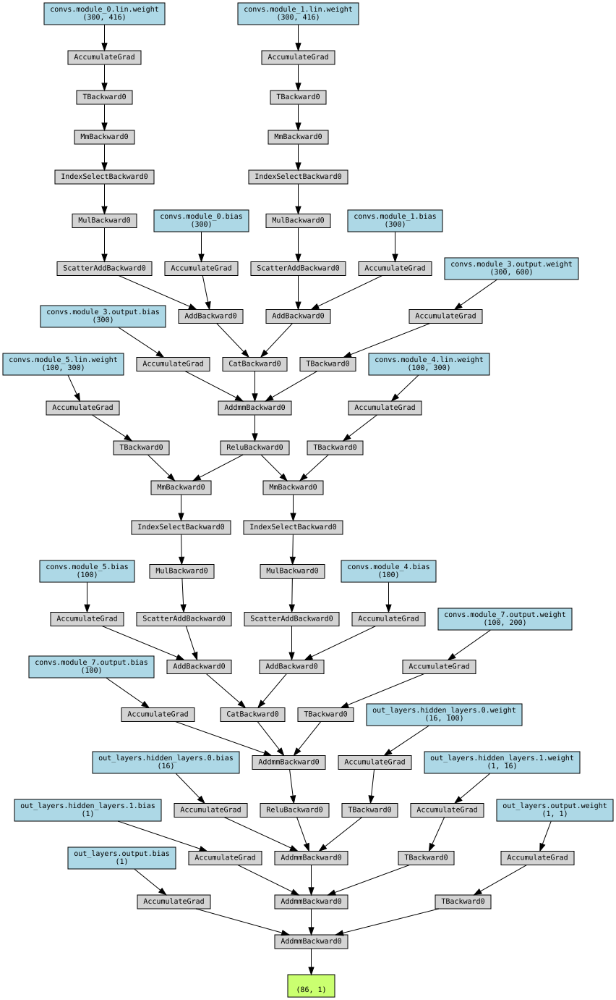

In [10]:
in_channels = num_node_features
HIDDEN_CHANNELS = [300,100]
OUT_CHANNELS = [16,1]
conv_type = GCNConv
agg = 'mlp'
model = MultiGraphAnomalyPredictor(in_channels,HIDDEN_CHANNELS,OUT_CHANNELS,GCNConv,agg)

tot_params = 0
for name,param in model.named_parameters():
    print(name,param.shape,param.numel())
    tot_params += param.numel()
print('Total trainable Params:',tot_params)

g = data_list[0]

x = g['node'].x
edge_list_jobs,eweight_jobs = g[job_proximity].values()
edge_list_racks,eweight_racks = g[node_proximity].values()
out = model (x,edge_list_jobs,edge_list_racks)

make_dot(out, params=dict(list(model.named_parameters())))


In [11]:
def train(train_data, logpath, logger_name,device, num_epochs, initial_lr, batch_size,es_patience, es_min_delta = 0, max_num_ckpt=-1, apply_weight_balancing = False):
  # Create model
  in_channels, out_channels = num_node_features, 16
  model = MultiGraphAnomalyPredictor(in_channels,HIDDEN_CHANNELS,OUT_CHANNELS,GCNConv,agg).to(device)

  # Prepare dataloader
  train_loader = DataLoader(train_data, batch_size = batch_size, shuffle = False)

  # Compute weight balancing
  pos_weight = None
  if apply_weight_balancing:
    train_labels = torch.cat([g['node'].y for g in train_data])
    train_ones = len(train_labels.nonzero())
    train_zeros = len(train_labels)-train_ones
    pos_weight = torch.tensor(train_zeros/train_ones)

  # Set up training
  criterion = torch.nn.BCEWithLogitsLoss(weight = pos_weight)
  optimizer = torch.optim.Adam([p for p in model.parameters()],lr = initial_lr)
  scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=num_epochs,eta_min=initial_lr * 1e-1)
  trainer =  MyTrainer(model,
                       optimizer,
                       scheduler,
                       es_patience,
                       es_min_delta,
                       max_num_ckpt)

  trainer.train(num_epochs,criterion,train_loader,logger_name,device,logpath)
  model.load_state_dict(torch.load(os.path.join(logpath,'BestModel/best-model.pt'))['model'])
  return model

def get_predictions(model,dataloader,device):
    model.eval()
    preds = []
    y_true = []
    with torch.no_grad():
        for g in tqdm(dataloader):
          g = g.to(device)
          x = g['node'].x
          y = g['node'].y
          edge_list_jobs,eweight_jobs = g[('node','same_job','node')].values()
          edge_list_racks,eweight_racks = g[('node','same_rack','node')].values()

          # Forward pass
          logits = model (x,edge_list_jobs,edge_list_racks,eweight_jobs,eweight_racks).squeeze()

          pred = torch.sigmoid(logits)
          preds.append(pred.detach().cpu().numpy())
          y_true.append(y.detach().cpu().numpy())

    preds = np.concatenate(preds).astype(float)
    y_true = np.concatenate(y_true).astype(int)

    return pd.DataFrame({'prob': preds,'true_class': y_true})

## Training Setup

In [12]:
TRAIN_SPLIT = 0.7
NUM_EPOCHS = 200
INITIAL_LR = 1e-3

TRAIN_BATCH_SIZE = 64
TEST_BATCH_SIZE = 64

ES_PATIENCE = 50
ES_MIN_DELTA = 0

APPLY_WEIGHT_BALANCING = False # whether to use weight balancing inside the loss

LOGGER_NAME = f'train.output'
BASE_LOGPATH = f'out'

MAX_NUM_CKPT = 10
# Select device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Available device:',device)

if not os.path.exists(BASE_LOGPATH):
  os.makedirs(BASE_LOGPATH)

Available device: cuda


## Window size 4

In [13]:
window_size = 4
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g['node'].y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

/content/utils/data_processing.py:124: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  return torch.tensor(labels)


In [14]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT) # train/test split, drop last window_size samples
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 0.07889792126283891, Train Acc at 50%: 0.9977125428898208


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 0.02174131369436237, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 0.015056938186272174, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 0.013158190608898796, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 0.013451154157544403, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 0.013372245505066185, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 0.014111214242714337, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 0.017486552418351658, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 0.017993943170637013, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 0.012624812247531732, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 0.011553245640761309, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 0.011611055957287486, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 0.010786067083805799, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 0.010068053644863875, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 0.010277356145648786, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 0.009586580694009162, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 0.00971942396960184, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 0.009300638289405723, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 0.008619105507645181, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 0.008649512214794956, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 0.00849559866318841, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 0.008245079535169302, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 0.008187802357468436, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 0.008616894932028043, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 0.008383974175965302, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 0.008085842807974494, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 0.009086163862943196, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 0.008049520928979852, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 0.008486504505665031, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 0.008303213567567587, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 0.007980110907767964, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 0.0078097275412306435, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 0.009491981745370422, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 0.008774992836366223, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 0.008747930736969063, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 0.008676277289480712, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 0.00848644359506753, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 0.009622505627536948, Train Acc at 50%: 0.9973873651633738


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 0.008625333445142377, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 0.00984349954109819, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 0.007608283876300711, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 0.008020170233649657, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 0.007459334196196051, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 0.007431887470329284, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 0.007402106978872908, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 0.007383897447775335, Train Acc at 50%: 0.997796640577695


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 0.0073625575225995015, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 0.0073859218696562924, Train Acc at 50%: 0.9975723800766971


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 0.007314438150574457, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 0.007297129275053402, Train Acc at 50%: 0.9975948061267969


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 0.00728329230358985, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 0.007323188060563651, Train Acc at 50%: 0.9975163149514475


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 0.00720390663216267, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 0.007552882608125098, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 0.007302186223423378, Train Acc at 50%: 0.997914377340719


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 0.007230296661821121, Train Acc at 50%: 0.997471462851248


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 0.007035106256771616, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 0.007056275084763461, Train Acc at 50%: 0.9975275279764975


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 0.007017373744623004, Train Acc at 50%: 0.9978358861653697


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 0.007037433178473865, Train Acc at 50%: 0.9974546433136732


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 0.006903809699722197, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 0.0068783052690880725, Train Acc at 50%: 0.9974938889013478


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 0.006777943082903851, Train Acc at 50%: 0.9977237559148707


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 0.006794553197525496, Train Acc at 50%: 0.997477069363773


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 0.006686450574737615, Train Acc at 50%: 0.9976396582269965


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 0.006657199800162869, Train Acc at 50%: 0.9974826758762979


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 0.006540413653093183, Train Acc at 50%: 0.9975163149514475


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 0.0065000675683311235, Train Acc at 50%: 0.9976116256643718


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 0.006542785744452006, Train Acc at 50%: 0.9979311968782938


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 0.006856433573864401, Train Acc at 50%: 0.9974826758762979


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 0.006647952339562636, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 0.0072458487114569784, Train Acc at 50%: 0.9980321141037429


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 0.007505176606896571, Train Acc at 50%: 0.9976060191518468


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 0.010102856180864692, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 0.011427611031724452, Train Acc at 50%: 0.9979536229283936


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 0.009502950443641585, Train Acc at 50%: 0.9978751317530443


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 0.008735994997413996, Train Acc at 50%: 0.9979536229283936


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 0.008277436065827816, Train Acc at 50%: 0.9979536229283936


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 0.008578213965060564, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 0.00875499978822275, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 0.007529708521136902, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 0.007602595237127447, Train Acc at 50%: 0.9979648359534435


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 0.007642475937549057, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 0.007298918951597926, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 0.007117257543080792, Train Acc at 50%: 0.9979648359534435


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 0.007315878788863644, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 0.0072404872100995015, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 0.00703120660975414, Train Acc at 50%: 0.9979536229283936


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 0.007229266656773508, Train Acc at 50%: 0.9979648359534435


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 0.007043108814261146, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 0.0072618380854951115, Train Acc at 50%: 0.9977854275526451


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 0.006852416211984341, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 0.007224513577002296, Train Acc at 50%: 0.9979480164158687


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 0.0075294176559241215, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 0.00756684824467101, Train Acc at 50%: 0.997477069363773


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 0.006862424028470221, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 0.007824668431725293, Train Acc at 50%: 0.9979648359534435


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 0.00780765179019449, Train Acc at 50%: 0.9974602498261981


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 0.006571253578312818, Train Acc at 50%: 0.9979592294409185


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 0.00714799549437877, Train Acc at 50%: 0.9976452647395214


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 0.007220845937766309, Train Acc at 50%: 0.9974658563387231


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 0.006568117024735933, Train Acc at 50%: 0.9977405754524455


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 0.006676138889652971, Train Acc at 50%: 0.9975331344890225


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 0.006484360162452204, Train Acc at 50%: 0.9975275279764975


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 0.006371293668162438, Train Acc at 50%: 0.9975387410015474


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 0.006321923233528066, Train Acc at 50%: 0.9975443475140724


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 0.00632196155929728, Train Acc at 50%: 0.9975051019263977


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 0.0062011607879024775, Train Acc at 50%: 0.9975443475140724


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 0.006186681859804599, Train Acc at 50%: 0.9975387410015474


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 0.006132830732115926, Train Acc at 50%: 0.997577986589222


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 0.006110537453430906, Train Acc at 50%: 0.9975723800766971


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 0.006087655600432963, Train Acc at 50%: 0.9975051019263977


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 0.00599265628438369, Train Acc at 50%: 0.9975443475140724


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 0.00598335749462826, Train Acc at 50%: 0.9975611670516472


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 0.005913791432784573, Train Acc at 50%: 0.9975723800766971


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 0.005862550563734834, Train Acc at 50%: 0.9975667735641721


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 0.00584670696449746, Train Acc at 50%: 0.9975555605391222


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 0.005828364661985112, Train Acc at 50%: 0.9975387410015474


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 0.005758702785718391, Train Acc at 50%: 0.9975499540265973


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 0.005762178796108309, Train Acc at 50%: 0.9975555605391222


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 0.00563695242495245, Train Acc at 50%: 0.9975723800766971


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 0.005576602341827141, Train Acc at 50%: 0.9976340517144715


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 0.005559558324746901, Train Acc at 50%: 0.9975555605391222


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 0.005538644773753567, Train Acc at 50%: 0.9975443475140724


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 0.005450258363865466, Train Acc at 50%: 0.9975723800766971


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 0.005415422292816586, Train Acc at 50%: 0.9976116256643718


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 0.005401170923973413, Train Acc at 50%: 0.997577986589222


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 0.006325293163663912, Train Acc at 50%: 0.9975948061267969


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 0.006382803033535004, Train Acc at 50%: 0.9979031643156691


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 0.0062075214968144495, Train Acc at 50%: 0.9979368033908188


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 0.006307763230581143, Train Acc at 50%: 0.9973481195756991


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 0.005517071129824404, Train Acc at 50%: 0.9977293624273956


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 0.005394433801256665, Train Acc at 50%: 0.9977069363772959


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 0.005360772141278685, Train Acc at 50%: 0.997589199614272


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 0.00530147909655606, Train Acc at 50%: 0.9976172321768967


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 0.005264013946178005, Train Acc at 50%: 0.9976060191518468


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 0.005218172219866222, Train Acc at 50%: 0.9976116256643718


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 0.00517887222328707, Train Acc at 50%: 0.9976060191518468


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 0.005140478699588692, Train Acc at 50%: 0.9976060191518468


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 0.005104159215954628, Train Acc at 50%: 0.9976060191518468


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 0.00507120452954089, Train Acc at 50%: 0.9976228386894216


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 0.005043869016843716, Train Acc at 50%: 0.9976228386894216


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 0.005021275291503611, Train Acc at 50%: 0.9976116256643718


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 0.004988905757459115, Train Acc at 50%: 0.9976620842770962


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 0.004966727798276102, Train Acc at 50%: 0.9976452647395214


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 0.004938263386358969, Train Acc at 50%: 0.9976676907896213


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 0.004915344576369286, Train Acc at 50%: 0.9977013298647709


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 0.004895030892103017, Train Acc at 50%: 0.9976789038146712


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 0.004873500022469851, Train Acc at 50%: 0.9977125428898208


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 0.004863919264555207, Train Acc at 50%: 0.9977125428898208


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 0.0048348765441561916, Train Acc at 50%: 0.9977293624273956


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 0.004823749752087024, Train Acc at 50%: 0.9977517884774955


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 0.004801648444442439, Train Acc at 50%: 0.9977854275526451


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 0.004778162276190648, Train Acc at 50%: 0.9978078536027449


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 0.004766280603345722, Train Acc at 50%: 0.9977854275526451


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 0.004742536078346107, Train Acc at 50%: 0.9978751317530443


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 0.004737459282702788, Train Acc at 50%: 0.9978807382655693


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 0.004715727544975619, Train Acc at 50%: 0.9979424099033437


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 0.004708384053838814, Train Acc at 50%: 0.997796640577695


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 0.004674422631594485, Train Acc at 50%: 0.9980377206162678


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 0.004667956869011544, Train Acc at 50%: 0.997914377340719


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 0.004642185184576028, Train Acc at 50%: 0.998127424816667


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 0.004664754956310375, Train Acc at 50%: 0.9979311968782938


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 0.004625629478858893, Train Acc at 50%: 0.9981498508667669


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 0.004625914868961786, Train Acc at 50%: 0.9979872620035433


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 0.004580263402718598, Train Acc at 50%: 0.9981442443542419


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 0.004582083192367504, Train Acc at 50%: 0.9979648359534435


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 0.00455426039489033, Train Acc at 50%: 0.99835729183019


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 0.004595618690592868, Train Acc at 50%: 0.9980096880536431


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 0.004534607487948626, Train Acc at 50%: 0.9983348657800901


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 0.004564009512434019, Train Acc at 50%: 0.9979872620035433


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 0.004491512555828601, Train Acc at 50%: 0.9983741113677648


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 0.004531385727974115, Train Acc at 50%: 0.9980993922540423


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 0.004469343151504788, Train Acc at 50%: 0.9983404722926151


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 0.004538851040305919, Train Acc at 50%: 0.9978639187279944


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 0.004463028296638125, Train Acc at 50%: 0.998463815568164


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 0.00451157575381751, Train Acc at 50%: 0.9982788006548406


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 0.004422895398967315, Train Acc at 50%: 0.998351685317665


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 0.004460437543078164, Train Acc at 50%: 0.9980657531788926


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 0.004400012177191901, Train Acc at 50%: 0.9983685048552399


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 0.004467857343559028, Train Acc at 50%: 0.9980152945661681


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 0.00439002147042442, Train Acc at 50%: 0.998458209055639


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 0.004444443720513248, Train Acc at 50%: 0.9983124397299904


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 0.004360572223116247, Train Acc at 50%: 0.998351685317665


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 0.004401153395409107, Train Acc at 50%: 0.9981106052790922


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 0.00434399974987508, Train Acc at 50%: 0.9984301764930142


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 0.004408476354883833, Train Acc at 50%: 0.9981554573792918


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 0.004320808895362853, Train Acc at 50%: 0.9984301764930142


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 0.0043796286852745645, Train Acc at 50%: 0.9981442443542419


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 0.004305855001482221, Train Acc at 50%: 0.9984526025431141


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 0.004367096500936112, Train Acc at 50%: 0.9982731941423157


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 0.004292369463634583, Train Acc at 50%: 0.9984133569554394


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 0.004349150801696251, Train Acc at 50%: 0.9981106052790922


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 0.004285763059166402, Train Acc at 50%: 0.9984694220806889


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 0.00435076185278069, Train Acc at 50%: 0.9984021439303895


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 0.004272992707547838, Train Acc at 50%: 0.9984021439303895


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 0.004293827553836537, Train Acc at 50%: 0.9982675876297907


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 0.004255406996783088, Train Acc at 50%: 0.9984245699804893


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 0.004305734549064693, Train Acc at 50%: 0.998245161579691


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 0.004245550772402223, Train Acc at 50%: 0.9984469960305892


In [15]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

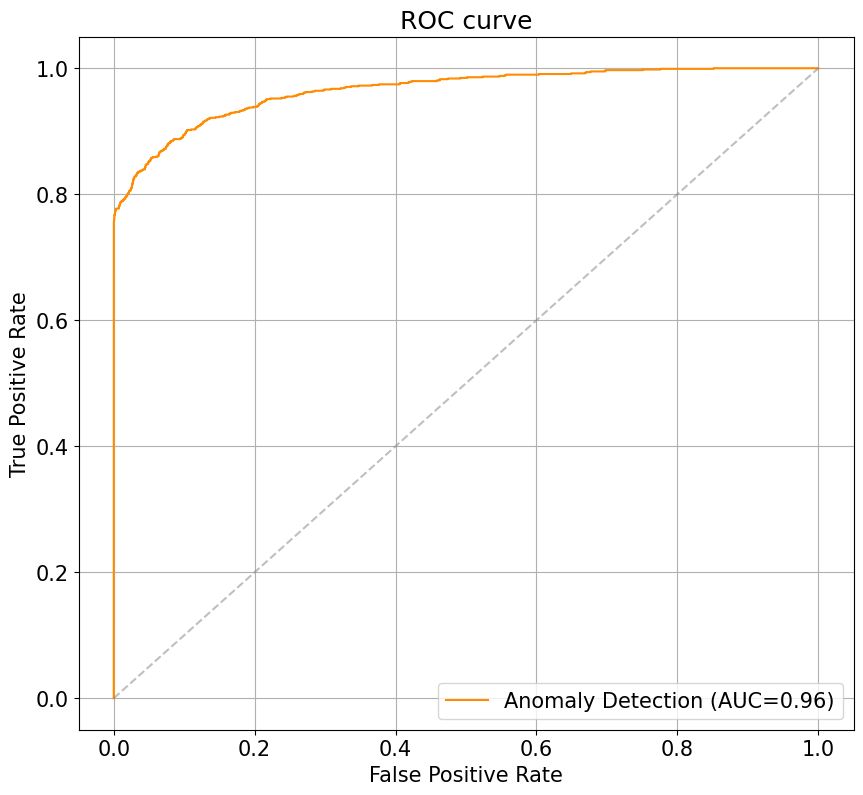


Best probability threshold: p=0.01%


In [16]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

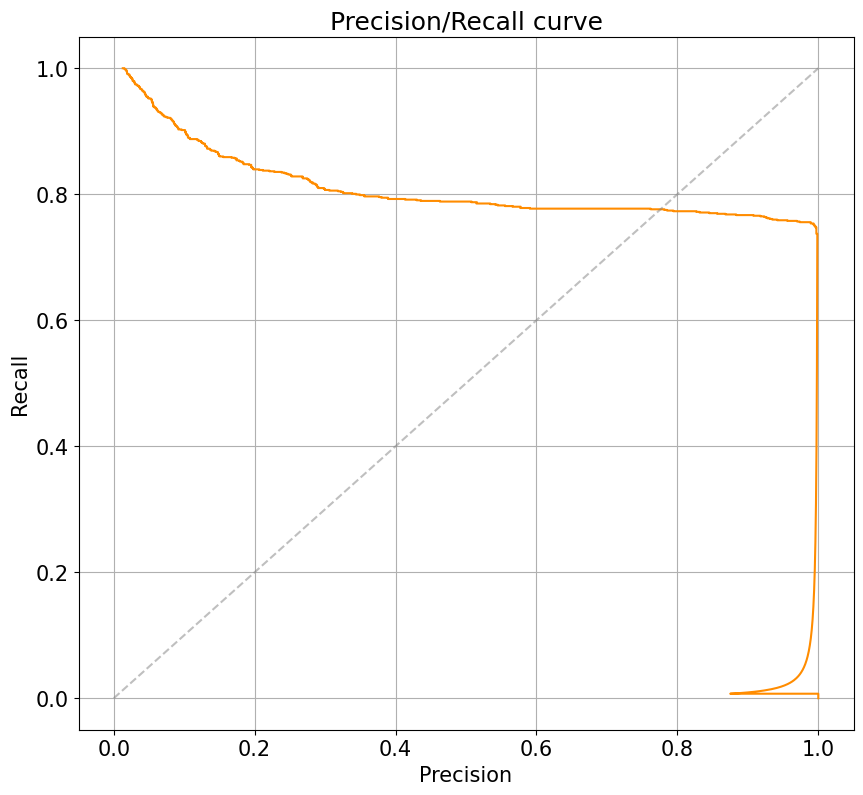

In [17]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

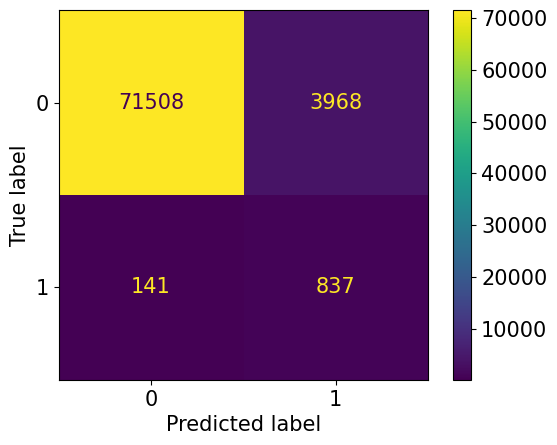


Classification Report
              precision    recall  f1-score   support

           0       1.00      0.95      0.97     75476
           1       0.17      0.86      0.29       978

    accuracy                           0.95     76454
   macro avg       0.59      0.90      0.63     76454
weighted avg       0.99      0.95      0.96     76454



In [18]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

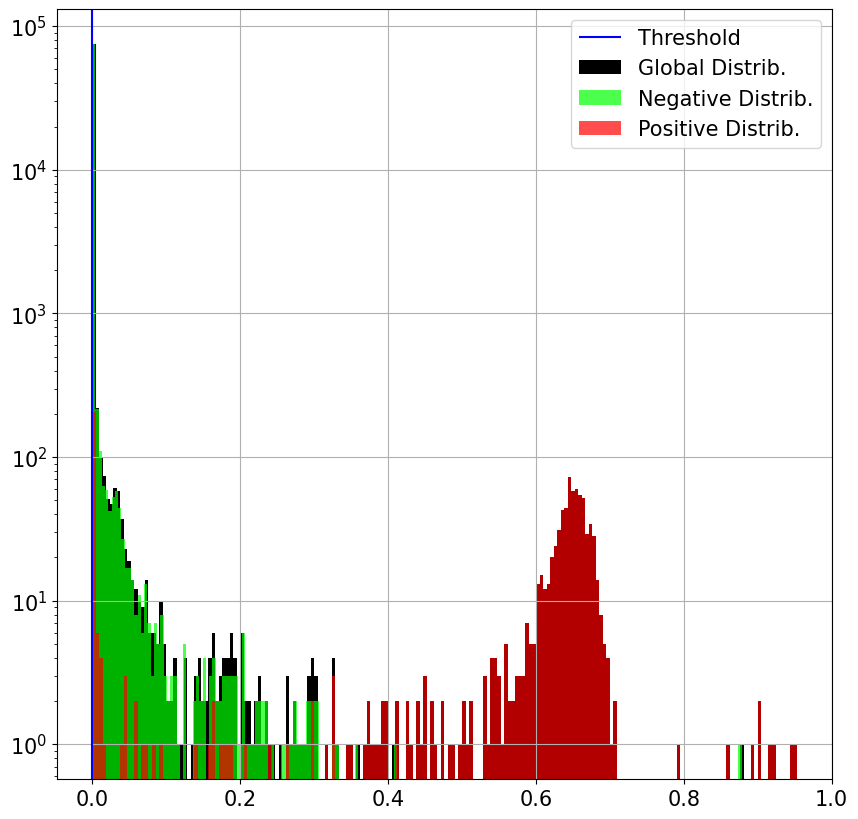

In [19]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

## Window size 24

In [20]:
window_size = 24
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g['node'].y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [21]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT) # train/test split, drop last window_size samples
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 0.09896157094831357, Train Acc at 50%: 0.9962268170707094


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 0.02652577132034071, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 0.02248169090402912, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 0.021423873666964046, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 0.020642086832439562, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 0.019862761059809574, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 0.01954916045321996, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 0.020765525922411474, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 0.02194258010260969, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 0.02496866375606905, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 0.02371228207748621, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 0.01902714841997965, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 0.02048538918745515, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 0.02115278865742947, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 0.018706853122774914, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 0.018834126158445652, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 0.020111294091716938, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 0.027430525016609295, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 0.028017495122334105, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 0.018836778849186216, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 0.018032910896484858, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 0.01790643175174783, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 0.018148535635869625, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 0.018779728204156947, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 0.01906364824004564, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 0.017984899657880093, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 0.018771469000891435, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 0.018609422173546792, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 0.018421283710032575, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 0.02029529610971104, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 0.017177479727639125, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 0.017154833304366353, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 0.017580985744916296, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 0.017869003900555885, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 0.01763004409828707, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 0.017747233350322234, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 0.017641025799944216, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 0.017675822860835147, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 0.017628390615101002, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 0.017637795485110505, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 0.01736338297754171, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 0.018876272185583274, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 0.0166246072375171, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 0.016497735253645635, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 0.01748070363221418, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 0.017871593627532743, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 0.016221040994031165, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 0.01812287927093612, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 0.015969012104460542, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 0.018484373401267913, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 0.015788875514047118, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 0.018393786339399348, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 0.015704958504799176, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 0.018667524039674487, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 0.015616772278616341, Train Acc at 50%: 0.9964062254715077


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 0.018046938128017005, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 0.01569051105858315, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 0.018948807810152273, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 0.015465620919948112, Train Acc at 50%: 0.9960642282074859


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 0.017315798797508185, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 0.015960168433214524, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 0.018867101376521467, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 0.015352765217389019, Train Acc at 50%: 0.9960474086699109


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 0.016785449540686462, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 0.015897102011196207, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 0.018274485063725022, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 0.015418072328128854, Train Acc at 50%: 0.9958904263192124


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 0.016119114979585285, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 0.01641718954331101, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 0.015355298824489527, Train Acc at 50%: 0.9961763584579848


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 0.017578708099203033, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 0.015117802245338185, Train Acc at 50%: 0.9960810477450607


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 0.01668655263078592, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 0.015521612131214118, Train Acc at 50%: 0.9964903231593819


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 0.017716812271009005, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 0.015085686619514729, Train Acc at 50%: 0.9958848198066874


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 0.016153710830187847, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 0.01529927065623178, Train Acc at 50%: 0.9964903231593819


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 0.015779704704985312, Train Acc at 50%: 0.9965744208472562


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 0.015262494343116464, Train Acc at 50%: 0.9961819649705097


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 0.01686884778327255, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 0.014884031478465386, Train Acc at 50%: 0.9960922607701106


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 0.016523873428249253, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 0.0148304903788741, Train Acc at 50%: 0.9962099975331344


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 0.0158258434560085, Train Acc at 50%: 0.9963165212711085


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 0.015290834880672389, Train Acc at 50%: 0.996585633872306


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 0.014912391178905917, Train Acc at 50%: 0.996266062658384


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 0.016814096684396096, Train Acc at 50%: 0.9965407817721065


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 0.014754827097781783, Train Acc at 50%: 0.9957222309434639


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 0.015540632662963799, Train Acc at 50%: 0.9963165212711085


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 0.014917841650799069, Train Acc at 50%: 0.9962997017335337


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 0.014927447731096942, Train Acc at 50%: 0.9962492431208091


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 0.014898639071645623, Train Acc at 50%: 0.9962156040456595


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 0.014755295219677177, Train Acc at 50%: 0.9961819649705097


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 0.015160420500703617, Train Acc at 50%: 0.9964230450090825


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 0.014966390818950293, Train Acc at 50%: 0.9961146868202103


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 0.015918201715925718, Train Acc at 50%: 0.9965800273597811


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 0.014410897119969557, Train Acc at 50%: 0.9962548496333341


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 0.015730031770529646, Train Acc at 50%: 0.9962772756834338


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 0.014191185066510759, Train Acc at 50%: 0.9961034737951605


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 0.01506998263557949, Train Acc at 50%: 0.9962212105581844


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 0.01490775239205361, Train Acc at 50%: 0.9961315063577852


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 0.014524411204492639, Train Acc at 50%: 0.9962212105581844


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 0.015141687412223038, Train Acc at 50%: 0.9964118319840326


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 0.014117342259456085, Train Acc at 50%: 0.9961987845080846


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 0.01605259102567292, Train Acc at 50%: 0.9964678971092822


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 0.013890945096824472, Train Acc at 50%: 0.9968603529860286


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 0.014770134136250168, Train Acc at 50%: 0.9963165212711085


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 0.014625635036095428, Train Acc at 50%: 0.9961371128703101


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 0.013920227353281071, Train Acc at 50%: 0.9963165212711085


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 0.014187145804191148, Train Acc at 50%: 0.9961707519454599


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 0.013729256889177468, Train Acc at 50%: 0.9969500571864277


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 0.014836382965890679, Train Acc at 50%: 0.9961034737951605


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 0.014655137665725007, Train Acc at 50%: 0.9965744208472562


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 0.013638296151059071, Train Acc at 50%: 0.9964342580341324


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 0.014756803612451224, Train Acc at 50%: 0.9963557668587831


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 0.013294386704908923, Train Acc at 50%: 0.997034154874302


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 0.014412695693567647, Train Acc at 50%: 0.9961146868202103


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 0.013589135139377902, Train Acc at 50%: 0.996602453409881


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 0.014450717594182403, Train Acc at 50%: 0.9960978672826355


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 0.014290123039735456, Train Acc at 50%: 0.9963501603462582


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 0.013350455936490828, Train Acc at 50%: 0.9965071426969568


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 0.013451790639068843, Train Acc at 50%: 0.9963837994214079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 0.013308797194133205, Train Acc at 50%: 0.9962156040456595


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 0.013110168420074259, Train Acc at 50%: 0.9967538292480546


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 0.01346716337885588, Train Acc at 50%: 0.9961763584579848


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 0.013382979458000915, Train Acc at 50%: 0.9970229418492521


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 0.01643787998357642, Train Acc at 50%: 0.9965576013096813


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 0.013227667015818075, Train Acc at 50%: 0.9969836962615775


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 0.01399745240946884, Train Acc at 50%: 0.9966529120226054


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 0.01284202354454935, Train Acc at 50%: 0.9962940952210088


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 0.012764266033925007, Train Acc at 50%: 0.9965576013096813


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 0.01289463113790479, Train Acc at 50%: 0.9964286515216075


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 0.01288373840678332, Train Acc at 50%: 0.9961202933327353


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 0.013315402914212649, Train Acc at 50%: 0.9962099975331344


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 0.013116345712804994, Train Acc at 50%: 0.9961707519454599


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 0.013329515009948056, Train Acc at 50%: 0.9969332376488529


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 0.01301060080921248, Train Acc at 50%: 0.9959969500571865


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 0.012448970880825166, Train Acc at 50%: 0.9969893027741024


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 0.012636290815411181, Train Acc at 50%: 0.9960698347200108


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 0.012400354642577818, Train Acc at 50%: 0.9970061223116773


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 0.012639541661906971, Train Acc at 50%: 0.9960642282074859


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 0.01226079682909668, Train Acc at 50%: 0.9970621874369268


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 0.012417319270564688, Train Acc at 50%: 0.9961202933327353


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 0.01215594299963838, Train Acc at 50%: 0.9969332376488529


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 0.012259146083465554, Train Acc at 50%: 0.9961371128703101


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 0.012071507223728583, Train Acc at 50%: 0.9970734004619767


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 0.012128618094966613, Train Acc at 50%: 0.9961763584579848


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 0.011926318259728, Train Acc at 50%: 0.9968547464735036


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 0.01197953359028097, Train Acc at 50%: 0.9962772756834338


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 0.011878297439680933, Train Acc at 50%: 0.9970790069745016


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 0.011913636536450741, Train Acc at 50%: 0.9962043910206095


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 0.01171476822633421, Train Acc at 50%: 0.9970229418492521


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 0.011777209117047863, Train Acc at 50%: 0.9962772756834338


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 0.011658912524037923, Train Acc at 50%: 0.9970734004619767


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 0.011637907264953971, Train Acc at 50%: 0.9962268170707094


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 0.011518700434925208, Train Acc at 50%: 0.9969500571864277


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 0.011470312098126934, Train Acc at 50%: 0.9964062254715077


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 0.011451573534536467, Train Acc at 50%: 0.9969388441613779


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 0.011382883490274803, Train Acc at 50%: 0.9963837994214079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 0.01135366761952559, Train Acc at 50%: 0.9968603529860286


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 0.011260902832699213, Train Acc at 50%: 0.9966977641228051


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 0.011261515360617893, Train Acc at 50%: 0.9969893027741024


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 0.011166548895227947, Train Acc at 50%: 0.9964230450090825


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 0.011120770817068608, Train Acc at 50%: 0.996927631136328


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 0.011040697334961791, Train Acc at 50%: 0.9966473055100805


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 0.011044397140468369, Train Acc at 50%: 0.9968659594985535


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 0.01094375709245735, Train Acc at 50%: 0.9968323204234039


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 0.010950816562268732, Train Acc at 50%: 0.9968883855486533


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 0.010849609155995605, Train Acc at 50%: 0.9968267139108788


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 0.010831663798950111, Train Acc at 50%: 0.9968659594985535


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 0.010748587219069922, Train Acc at 50%: 0.9969332376488529


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 0.010736853374191961, Train Acc at 50%: 0.9968827790361283


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 0.010658807735909782, Train Acc at 50%: 0.9969332376488529


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 0.010640880172971424, Train Acc at 50%: 0.9968883855486533


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 0.010570540751856107, Train Acc at 50%: 0.9969724832365275


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 0.010553506316218169, Train Acc at 50%: 0.9969052050862282


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 0.01048711513372058, Train Acc at 50%: 0.9969836962615775


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 0.010468775568763175, Train Acc at 50%: 0.9969500571864277


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 0.010408851859820368, Train Acc at 50%: 0.9969836962615775


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 0.010390212532596614, Train Acc at 50%: 0.9969612702114776


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 0.010333690920060243, Train Acc at 50%: 0.9969949092866274


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 0.010316361512877108, Train Acc at 50%: 0.9969724832365275


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 0.010263493167413268, Train Acc at 50%: 0.9970173353367271


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 0.010247433301335332, Train Acc at 50%: 0.9970005157991523


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 0.010197934886007336, Train Acc at 50%: 0.9970509744118768


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 0.010185073168492521, Train Acc at 50%: 0.9970173353367271


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 0.010137136528259977, Train Acc at 50%: 0.9970734004619767


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 0.010127396307769855, Train Acc at 50%: 0.9970397613868269


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 0.010084188793702766, Train Acc at 50%: 0.9970846134870265


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 0.010074367815341802, Train Acc at 50%: 0.9970509744118768


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 0.010034366662502663, Train Acc at 50%: 0.9971070395371263


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 0.010027329093130831, Train Acc at 50%: 0.9970621874369268


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 0.009990012112914112, Train Acc at 50%: 0.9971070395371263


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 0.009981403871393261, Train Acc at 50%: 0.9970734004619767


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 0.009947055085124381, Train Acc at 50%: 0.9971182525621762


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 0.009940020937696229, Train Acc at 50%: 0.9970790069745016


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 0.009907949112751873, Train Acc at 50%: 0.9971238590747011


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 0.00989999104053018, Train Acc at 50%: 0.9970790069745016


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 0.00987105576916271, Train Acc at 50%: 0.9971182525621762


In [22]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

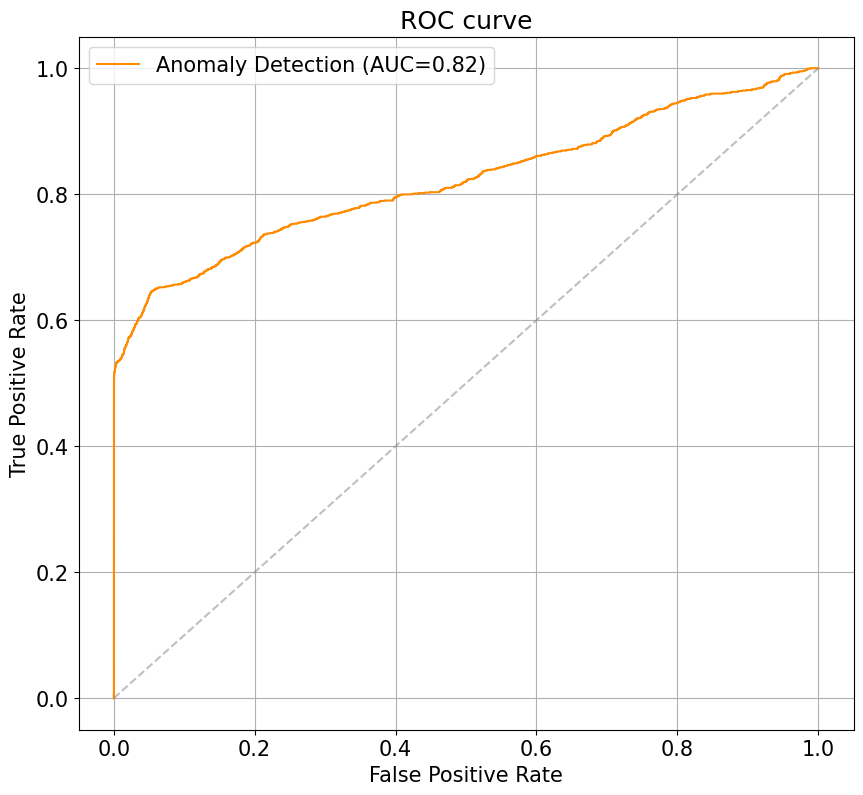


Best probability threshold: p=0.82%


In [23]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

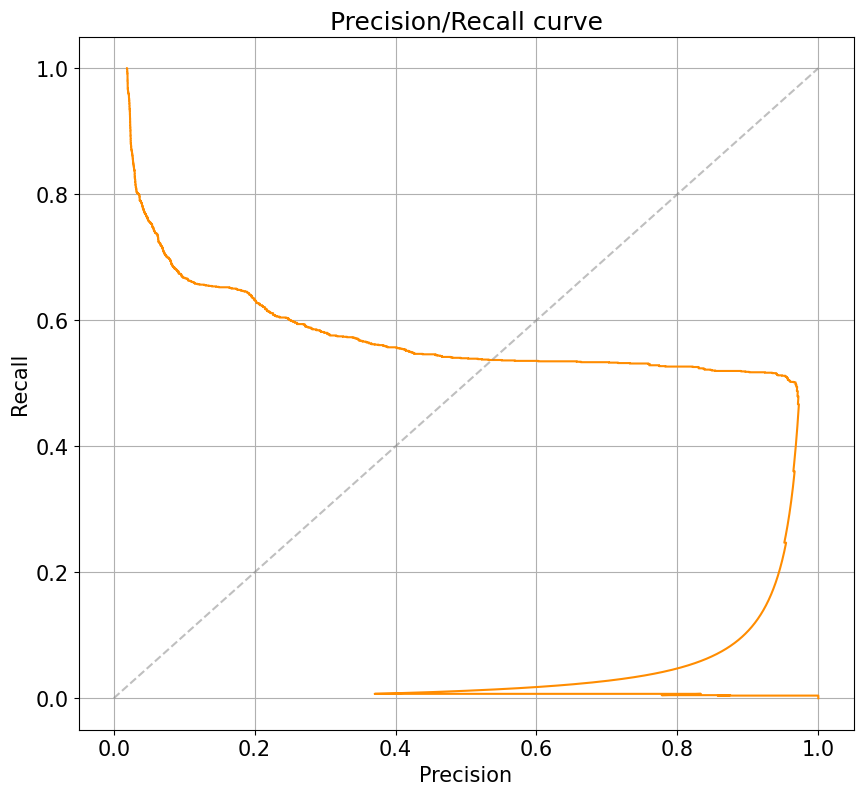

In [24]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

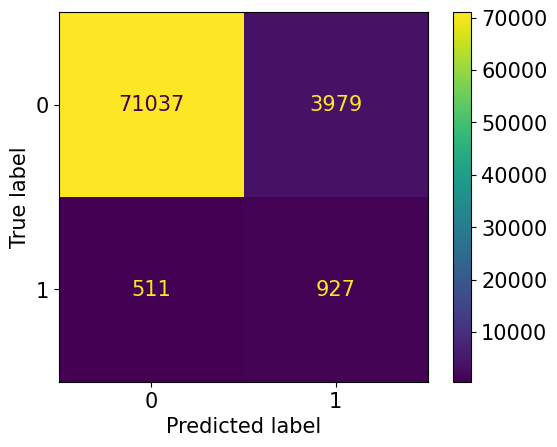


Classification Report
              precision    recall  f1-score   support

           0       0.99      0.95      0.97     75016
           1       0.19      0.64      0.29      1438

    accuracy                           0.94     76454
   macro avg       0.59      0.80      0.63     76454
weighted avg       0.98      0.94      0.96     76454



In [25]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

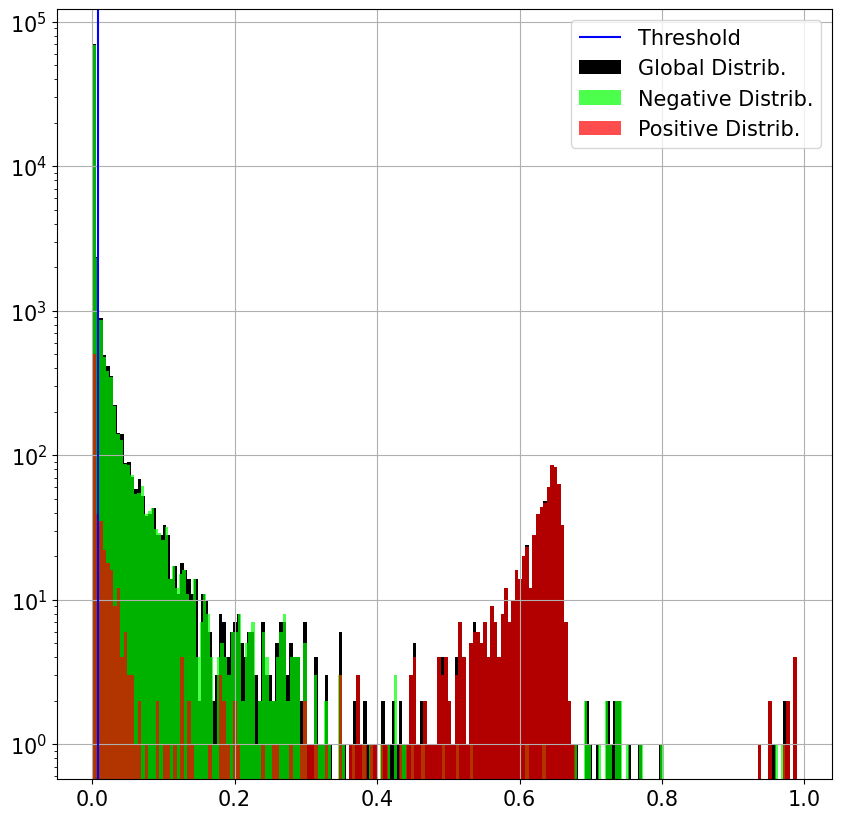

In [26]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

## Window size 64

In [27]:
window_size = 64
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g['node'].y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [28]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT) # train/test split, drop last window_size samples
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 0.16740535024234152, Train Acc at 50%: 0.9936478213092328


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 0.04115110659416979, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 0.04188351478139507, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 0.04143659524904129, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 0.04066153595579125, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 0.04011920442098041, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 0.039731262772336344, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 0.039427733630385056, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 0.039193346913649896, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 0.03943281726991574, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 0.03810425448012912, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 0.03847072548534878, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 0.038769650059884565, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 0.03863161432695219, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 0.038434077837315825, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 0.03853802553608772, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 0.0372459132903781, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 0.038232251599082494, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 0.03823986473938126, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 0.038042051756695575, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 0.03769001314113975, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 0.037491187263124844, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 0.03730728379710872, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 0.037098980503878304, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 0.03690132629937936, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 0.03703576214756061, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 0.035902677206092595, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 0.03687291869172731, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 0.03620907804317996, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 0.035836548828869615, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 0.03692705657829635, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 0.035879687219674376, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 0.03651407725213608, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 0.03614980724109125, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 0.03582227521739252, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 0.035623323411850205, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 0.035438303023417, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 0.035307111177844186, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 0.03517862129900092, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 0.035045622667165176, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 0.035019013633111225, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 0.034787766891896624, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 0.034768116722509866, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 0.034540231698766286, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 0.03453461423602156, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 0.03441231670646123, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 0.034370889287496355, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 0.03417492962950763, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 0.03413746345254648, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 0.03398942469384938, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 0.033973702915807, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 0.03380164758758774, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 0.033798962046187854, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 0.0335938425293571, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 0.03361627952967667, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 0.03358643196812417, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 0.03305274289427099, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 0.03348674664239981, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 0.0334103715970221, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 0.03308204568238966, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 0.033125414027809705, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 0.03285201715312507, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 0.032763602341104425, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 0.03295223082695359, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 0.033810180546347636, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 0.033007970183164766, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 0.03282218875445718, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 0.03252136705434533, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 0.03257126720586133, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 0.03224390491056912, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 0.03219232116276267, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 0.03207918896715425, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 0.03190594006497948, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 0.031957685328527614, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 0.03197487991112977, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 0.03146130365344885, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 0.03167194755615623, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 0.03140080916430025, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 0.03184857186357673, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 0.032095625247036956, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 0.031193135508706914, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 0.031064221308847357, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 0.031067884157362193, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 0.030798974135230483, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 0.03137176096879135, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 0.03118595763964421, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 0.030823995387417022, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 0.030736807000011215, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 0.030962014695019736, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 0.03113953144535192, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 0.030217542103157028, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 0.030173962966006312, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 0.03002931056277472, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 0.029928168857820243, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 0.029747487493972997, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 0.029634650954298514, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 0.030133354075969645, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 0.030158925576699896, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 0.030174151857297438, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 0.030088989260550054, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 0.029889498156683805, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 0.03102114861936125, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 0.02954842892378787, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 0.02885291476454049, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 0.028764995449964678, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 0.02875739052233074, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 0.02823671852223543, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 0.028274031396119732, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 0.028484645185722735, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 0.027934432230228633, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 0.0306645547123789, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 0.030361337651691203, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 0.02797912281468654, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 0.028729363434815882, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 0.027397154221844095, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 0.028322179512471686, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 0.02734871044955821, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 0.028202490872772813, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 0.027363649286886647, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 0.02830188601767313, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 0.026862731483265963, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 0.027079677237454025, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 0.026283782413526552, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 0.02729852832988299, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 0.02592863393555454, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 0.026383109119553272, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 0.02580535362376937, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 0.025967173234053675, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 0.025518446915436973, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 0.02563659157414753, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 0.025758344330274047, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 0.025104550508370523, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 0.025752286121183368, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 0.024845180865218038, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 0.026245240377472473, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 0.025299631411222274, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 0.025539619165372496, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 0.02473896099584277, Train Acc at 50%: 0.9937879841223566


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 0.024930584366800474, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 0.024521303477369312, Train Acc at 50%: 0.9938945078603305


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 0.024329113432538237, Train Acc at 50%: 0.9940066381108296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 0.024492129354332995, Train Acc at 50%: 0.9937767710973067


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 0.024148478607125035, Train Acc at 50%: 0.9940178511358795


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 0.024470491720057018, Train Acc at 50%: 0.9939898185732547


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 0.023894537535426152, Train Acc at 50%: 0.9941131618488036


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 0.024743001626939855, Train Acc at 50%: 0.9939281469354803


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 0.024003984982080184, Train Acc at 50%: 0.9944663721378754


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 0.02385604477536106, Train Acc at 50%: 0.993849655760131


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 0.023594033391687783, Train Acc at 50%: 0.993849655760131


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 0.02330331326931864, Train Acc at 50%: 0.9938664752977058


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 0.023265113427632537, Train Acc at 50%: 0.9939225404229554


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 0.023126527446156456, Train Acc at 50%: 0.9937879841223566


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 0.023041638604903457, Train Acc at 50%: 0.9938720818102308


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 0.023029628951364907, Train Acc at 50%: 0.9937991971474064


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 0.022818881021569655, Train Acc at 50%: 0.9939449664730551


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 0.02312540778618443, Train Acc at 50%: 0.9937263124845821


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 0.022823652579836737, Train Acc at 50%: 0.9939786055482048


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 0.022818924822448756, Train Acc at 50%: 0.9944663721378754


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 0.022489579168599744, Train Acc at 50%: 0.9939225404229554


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 0.02262433394193195, Train Acc at 50%: 0.9937150994595322


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 0.0222546996919747, Train Acc at 50%: 0.993838442735081


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 0.022592305917866692, Train Acc at 50%: 0.993737525509632


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 0.02209060927986449, Train Acc at 50%: 0.9938720818102308


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 0.022208120194605555, Train Acc at 50%: 0.9937207059720572


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 0.02194845763307408, Train Acc at 50%: 0.993849655760131


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 0.02208833163415123, Train Acc at 50%: 0.9936197887466081


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 0.021867564253261588, Train Acc at 50%: 0.9938104101724563


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 0.02189492063981521, Train Acc at 50%: 0.9937767710973067


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 0.021778552654263192, Train Acc at 50%: 0.9937599515597317


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 0.021711735781971837, Train Acc at 50%: 0.9941972595366778


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 0.02167259285260759, Train Acc at 50%: 0.9938160166849813


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 0.021638144829971995, Train Acc at 50%: 0.9940010315983046


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 0.021532765389964483, Train Acc at 50%: 0.9939842120607297


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 0.021447992894796597, Train Acc at 50%: 0.9939673925231549


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 0.021350407273714147, Train Acc at 50%: 0.9939673925231549


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 0.021313796582672934, Train Acc at 50%: 0.994062703236079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 0.021109488750883025, Train Acc at 50%: 0.9940010315983046


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 0.021166291647189875, Train Acc at 50%: 0.9941075553362786


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 0.02096260797792716, Train Acc at 50%: 0.994062703236079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 0.02102437269256969, Train Acc at 50%: 0.9941075553362786


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 0.020839160675290416, Train Acc at 50%: 0.9940402771859792


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 0.020885536224816245, Train Acc at 50%: 0.994286963737077


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 0.020737698676407516, Train Acc at 50%: 0.9941075553362786


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 0.020763387892000346, Train Acc at 50%: 0.994281357224552


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 0.02064192805425282, Train Acc at 50%: 0.9941411944114283


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 0.02064893893246395, Train Acc at 50%: 0.9943486353748514


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 0.02055007076689032, Train Acc at 50%: 0.9941692269740531


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 0.02054993388914313, Train Acc at 50%: 0.9943262093247517


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 0.02046409237876968, Train Acc at 50%: 0.9942028660492027


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 0.020458797947508326, Train Acc at 50%: 0.9943262093247517


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 0.020378441128464826, Train Acc at 50%: 0.9941860465116279


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 0.02037119755808347, Train Acc at 50%: 0.9943878809625261


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 0.020307067595969477, Train Acc at 50%: 0.9941468009239532


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 0.020299824025588123, Train Acc at 50%: 0.9944271265502007


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 0.020236791823006604, Train Acc at 50%: 0.9943093897871768


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 0.02022137117600805, Train Acc at 50%: 0.9943598483999013


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 0.02017238810539823, Train Acc at 50%: 0.9943766679374761


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 0.02015607364671052, Train Acc at 50%: 0.9943037832746519


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 0.020120485432440823, Train Acc at 50%: 0.9943822744500012


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 0.02010260919865766, Train Acc at 50%: 0.9943037832746519


In [29]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

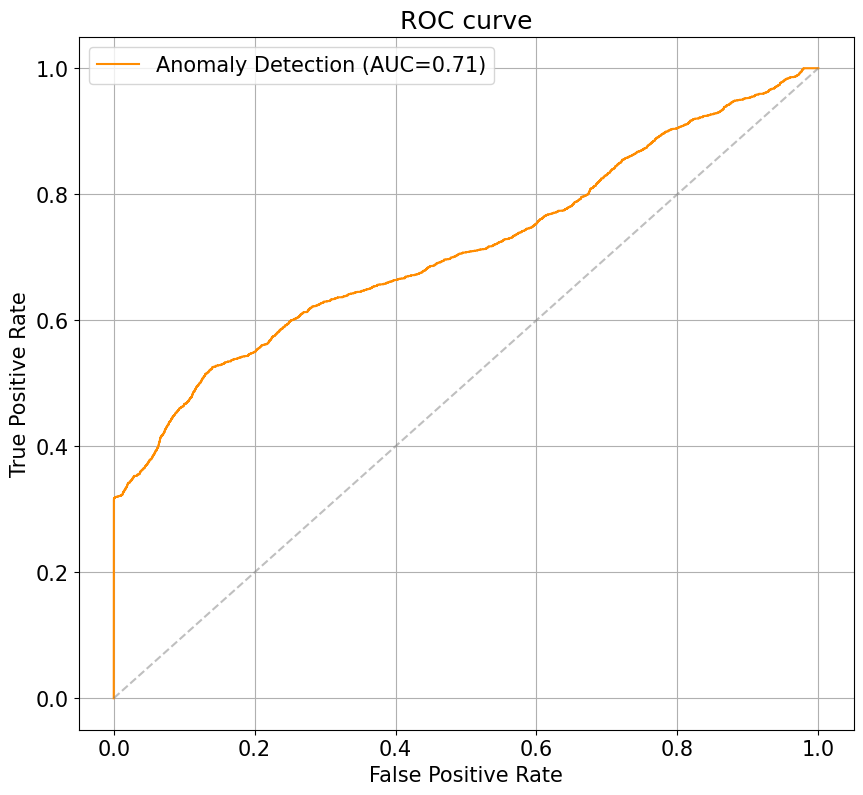


Best probability threshold: p=0.57%


In [30]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

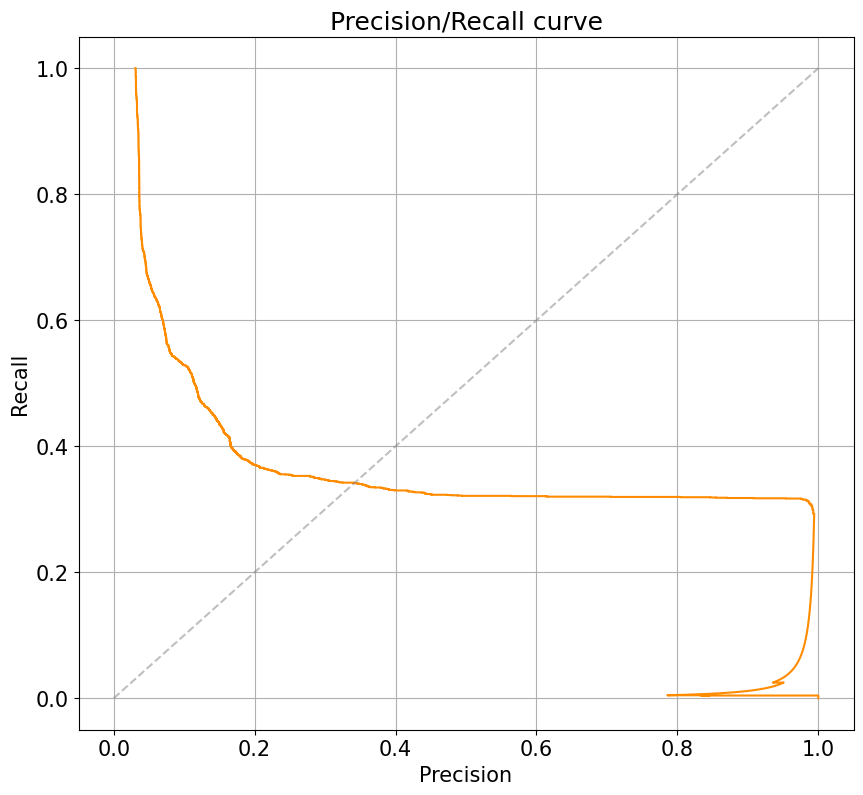

In [31]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

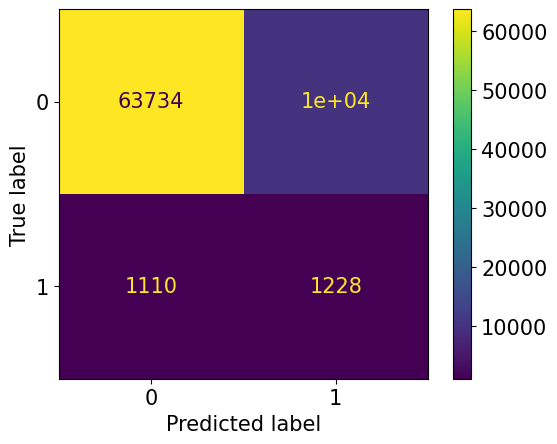


Classification Report
              precision    recall  f1-score   support

           0       0.98      0.86      0.92     74116
           1       0.11      0.53      0.18      2338

    accuracy                           0.85     76454
   macro avg       0.54      0.69      0.55     76454
weighted avg       0.96      0.85      0.89     76454



In [32]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

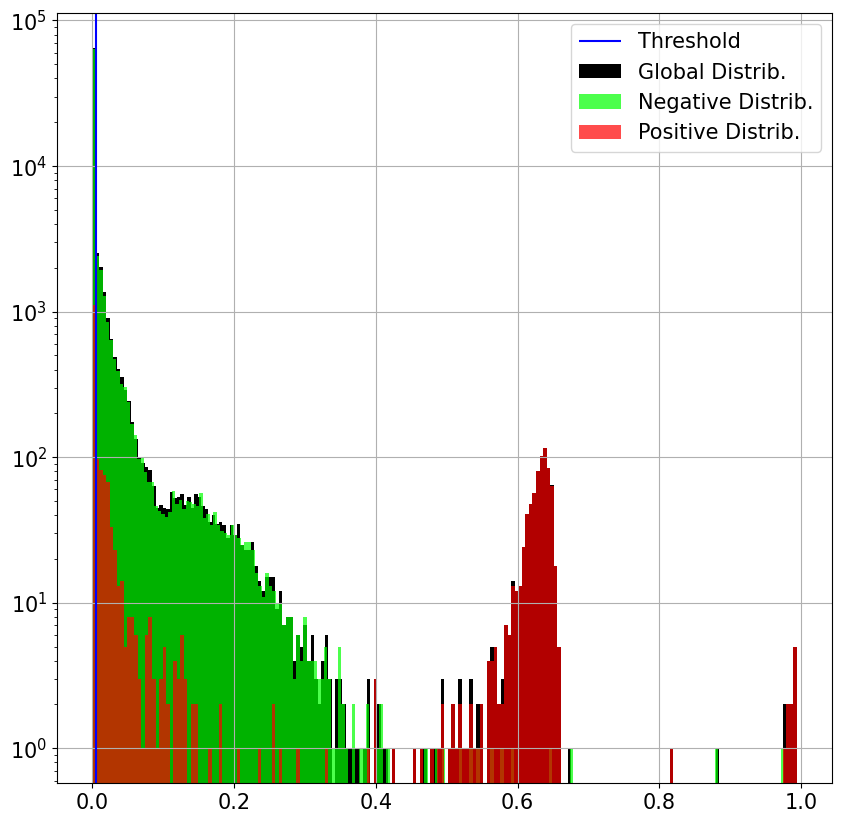

In [33]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

## Window size 192

In [34]:
window_size = 192
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g['node'].y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [35]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT) # train/test split, drop last window_size samples
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device, NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA,MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 0.21494370360610884, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 0.09959437319890785, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 0.09802595132005337, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 0.09837285428253459, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 0.09748017046601332, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 0.09624829264173264, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 0.09064074532101489, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 0.08957787866385593, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 0.08934508246654313, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 0.08794970691079758, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 0.09722155912558027, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 0.11698108835723577, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 0.12323279878156466, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 0.0908845738647513, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 0.08798486806649604, Train Acc at 50%: 0.985389428359983


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 0.08801037660346259, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 0.09969487431600547, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 0.09754946345675136, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 0.09383027606117265, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 0.08982612014616179, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 0.08714466317824786, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 0.0852753183097486, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 0.08392960747579388, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 0.08294983656139972, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 0.08203494569917416, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 0.08180314597186092, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 0.08174807731661098, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 0.0803251455328009, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 0.07930017211117434, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 0.07867028809415016, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 0.07858454787330964, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 0.07774318773687515, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 0.07747382328062277, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 0.07686382486271053, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 0.07610784906497388, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 0.07571142920866879, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 0.07534442164268014, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 0.0744104226469467, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 0.07673902520793154, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 0.07654286297087697, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 0.07436928267125092, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 0.07325886468471776, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 0.07295456355227233, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 0.07225970093110157, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 0.07182798304135084, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 0.07183529231305084, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 0.07089494766495762, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 0.07382007987353109, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 0.07358538381308728, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 0.06932529388637841, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 0.07430837207375086, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 0.07393488745276514, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 0.07060332141190206, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 0.07316637912849566, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 0.07155533899427576, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 0.06868144833914075, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 0.06975892806458983, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 0.06663861913874156, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 0.06561657490090489, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 0.0708661485869486, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 0.07427722964870995, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 0.07376470461212745, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 0.07073770798409433, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 0.07486105156624935, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 0.06893290371095064, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 0.06817124474915061, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 0.0662802567712655, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 0.06347053987912359, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 0.06259867790550504, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 0.06443364455901976, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 0.07080167916802158, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 0.06869330742715739, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 0.06358842994522437, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 0.06756112587882084, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 0.07080982065642451, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 0.07045427797054057, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 0.07064483917018008, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 0.06347001426857438, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 0.07006253385807955, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 0.0676369233001054, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 0.06380423140144592, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 0.06351495397053217, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 0.06403714257606635, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 0.06297659736549976, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 0.06171641869820984, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 0.06126013399039324, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 0.06050801814512738, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 0.0592911640223784, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 0.060788699653517526, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 0.06178979064581418, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 0.06562014467255163, Train Acc at 50%: 0.9853557892848333


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 0.06706608834321949, Train Acc at 50%: 0.9848287771074881


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 0.06404611080606232, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 0.061884668825057186, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 0.06004706864368651, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 0.05830951514529277, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 0.06118403543806485, Train Acc at 50%: 0.9852885111345339


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 0.058891787606733983, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 0.06358587306890684, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 0.06446020431708473, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 0.06295973402704581, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 0.061832983787717816, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 0.05867625990600682, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 0.05716590704262071, Train Acc at 50%: 0.9853670023098832


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 0.05684980704836738, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 0.05609129079964287, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 0.05586553559364558, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 0.05615628582911911, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 0.05480344092698078, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 0.056630167540114594, Train Acc at 50%: 0.9852941176470589


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 0.0564781182634248, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 0.055251655322822994, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 0.05479408943929268, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 0.05702249201422372, Train Acc at 50%: 0.9850081855082864


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 0.054493265001625886, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 0.05829938071689074, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 0.059498988243493645, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 0.05811390589433686, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 0.05410570387311901, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 0.05313959335789453, Train Acc at 50%: 0.9849577268955619


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 0.054110056585479696, Train Acc at 50%: 0.985266085084434


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 0.05325918070806048, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 0.05228140820877531, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 0.05299144235944473, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 0.05228403626152138, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 0.05172306197754312, Train Acc at 50%: 0.9852268394967595


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 0.05159366870556839, Train Acc at 50%: 0.9853389697472584


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 0.051648063922302145, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 0.05085976855089872, Train Acc at 50%: 0.9853501827723083


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 0.05139325778324101, Train Acc at 50%: 0.9852268394967595


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 0.05050441749386087, Train Acc at 50%: 0.9853950348725079


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 0.0518310694702967, Train Acc at 50%: 0.985277298109484


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 0.05042013912736034, Train Acc at 50%: 0.985383821847458


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 0.05037720331562143, Train Acc at 50%: 0.9853726088224081


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 0.04960817485591263, Train Acc at 50%: 0.9852268394967595


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 0.050001868107493665, Train Acc at 50%: 0.9853053306721087


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 0.050086036971796435, Train Acc at 50%: 0.9854006413850328


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 0.0500602601544454, Train Acc at 50%: 0.985058644121011


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 0.04923514466904757, Train Acc at 50%: 0.9850978897086856


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 0.05160697869770525, Train Acc at 50%: 0.9851147092462604


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 0.051628966739014036, Train Acc at 50%: 0.9853333632347334


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 0.04911770356195757, Train Acc at 50%: 0.985383821847458


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 0.049450502641368216, Train Acc at 50%: 0.9848231705949632


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 0.04860045898065193, Train Acc at 50%: 0.9851875939090848


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 0.04910736107937981, Train Acc at 50%: 0.9849857594581867


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 0.04802013018322083, Train Acc at 50%: 0.9852604785719091


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 0.04820216663676526, Train Acc at 50%: 0.9850922831961607


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 0.04764956927091509, Train Acc at 50%: 0.9854174609226077


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 0.04831030553215615, Train Acc at 50%: 0.9851034962212105


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 0.04737275319010563, Train Acc at 50%: 0.9855408041981566


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 0.04833148873231145, Train Acc at 50%: 0.9852997241595838


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 0.04736535084153753, Train Acc at 50%: 0.9858940144872284


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 0.0471408111099353, Train Acc at 50%: 0.9856585409611806


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 0.04728763713179229, Train Acc at 50%: 0.9853389697472584


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 0.04691741567629959, Train Acc at 50%: 0.9859220470498531


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 0.04703460492833476, Train Acc at 50%: 0.9858547688995537


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 0.046481668105671545, Train Acc at 50%: 0.9858828014621784


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 0.04713590541147597, Train Acc at 50%: 0.9855127716355319


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 0.04635348483298199, Train Acc at 50%: 0.9856697539862304


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 0.04717916425469826, Train Acc at 50%: 0.9855127716355319


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 0.04627584229966529, Train Acc at 50%: 0.9858828014621784


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 0.046011142637037185, Train Acc at 50%: 0.9859164405373282


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 0.046123946326052344, Train Acc at 50%: 0.9857314256240048


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 0.04580956004119385, Train Acc at 50%: 0.9859164405373282


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 0.045911268420021696, Train Acc at 50%: 0.985832342849454


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 0.04554750211908653, Train Acc at 50%: 0.9858996209997534


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 0.04594573697431937, Train Acc at 50%: 0.9857594581866296


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 0.045386005540285594, Train Acc at 50%: 0.9858828014621784


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 0.04578570498741338, Train Acc at 50%: 0.9858099167993541


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 0.045238908500489165, Train Acc at 50%: 0.9858884079747035


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 0.045639412788770435, Train Acc at 50%: 0.9860341773003521


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 0.04510983552244287, Train Acc at 50%: 0.9860790294005517


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 0.04560381088672602, Train Acc at 50%: 0.986151914063376


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 0.0450509671409309, Train Acc at 50%: 0.9860622098629769


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 0.04569883141882611, Train Acc at 50%: 0.9862976833890247


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 0.04503980065431505, Train Acc at 50%: 0.9859052275122783


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 0.0458609439474894, Train Acc at 50%: 0.9863313224641744


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 0.045016219356028966, Train Acc at 50%: 0.9858211298244041


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 0.04608435580645478, Train Acc at 50%: 0.9863088964140746


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 0.04493582010488383, Train Acc at 50%: 0.985815523311879


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 0.04600827915456594, Train Acc at 50%: 0.9864714852772981


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 0.04477800279992739, Train Acc at 50%: 0.9859052275122783


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 0.045748260710891775, Train Acc at 50%: 0.9865219438900227


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 0.044565650662935066, Train Acc at 50%: 0.9860285707878271


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 0.04546533440744769, Train Acc at 50%: 0.986600435065372


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 0.04437627482458624, Train Acc at 50%: 0.986050996837927


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 0.045093826301131394, Train Acc at 50%: 0.986600435065372


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 0.04419101079376304, Train Acc at 50%: 0.9861014554506515


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 0.044746249900134, Train Acc at 50%: 0.9865443699401224


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 0.04402384473867344, Train Acc at 50%: 0.9861126684757013


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 0.04445226113716193, Train Acc at 50%: 0.9864939113273979


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 0.04387720760810758, Train Acc at 50%: 0.9861294880132763


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 0.04425126164052163, Train Acc at 50%: 0.9864658787647732


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 0.043763303422005004, Train Acc at 50%: 0.9861463075508511


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 0.044098358246689354, Train Acc at 50%: 0.9864490592271983


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 0.043670377119436936, Train Acc at 50%: 0.986157520575901


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 0.04398432265794947, Train Acc at 50%: 0.9864602722522482


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 0.04358745658018855, Train Acc at 50%: 0.9861631270884259


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 0.04389778307106535, Train Acc at 50%: 0.9864714852772981


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 0.04351455822958949, Train Acc at 50%: 0.9861687336009509


In [36]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

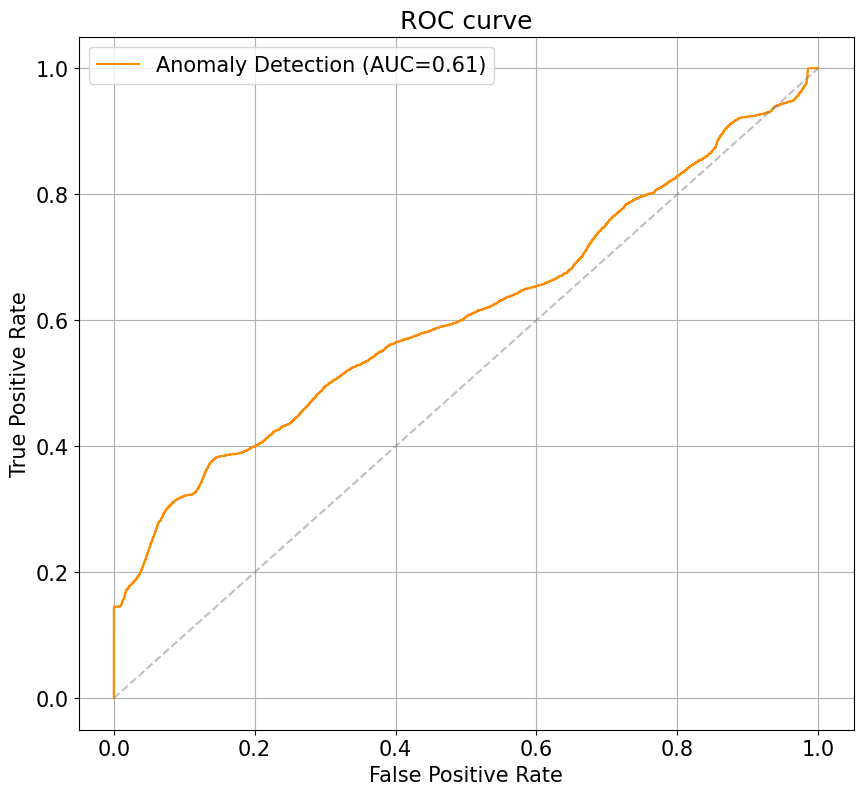


Best probability threshold: p=1.22%


In [37]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

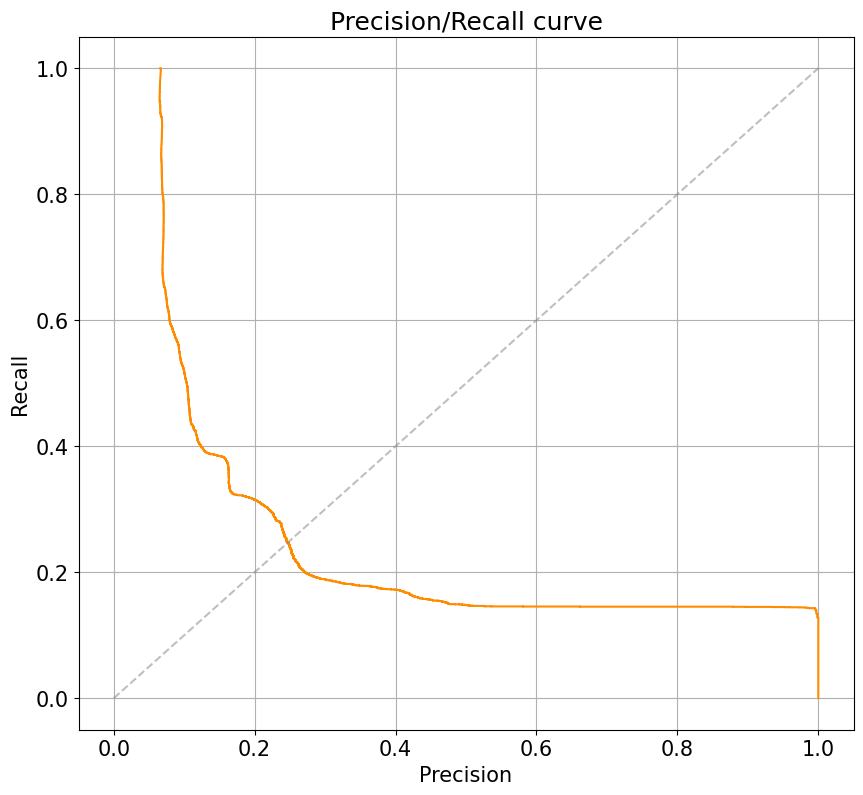

In [38]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

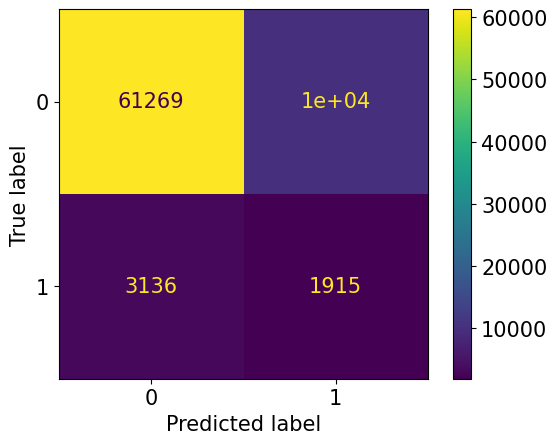


Classification Report
              precision    recall  f1-score   support

           0       0.95      0.86      0.90     71403
           1       0.16      0.38      0.22      5051

    accuracy                           0.83     76454
   macro avg       0.56      0.62      0.56     76454
weighted avg       0.90      0.83      0.86     76454



In [39]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

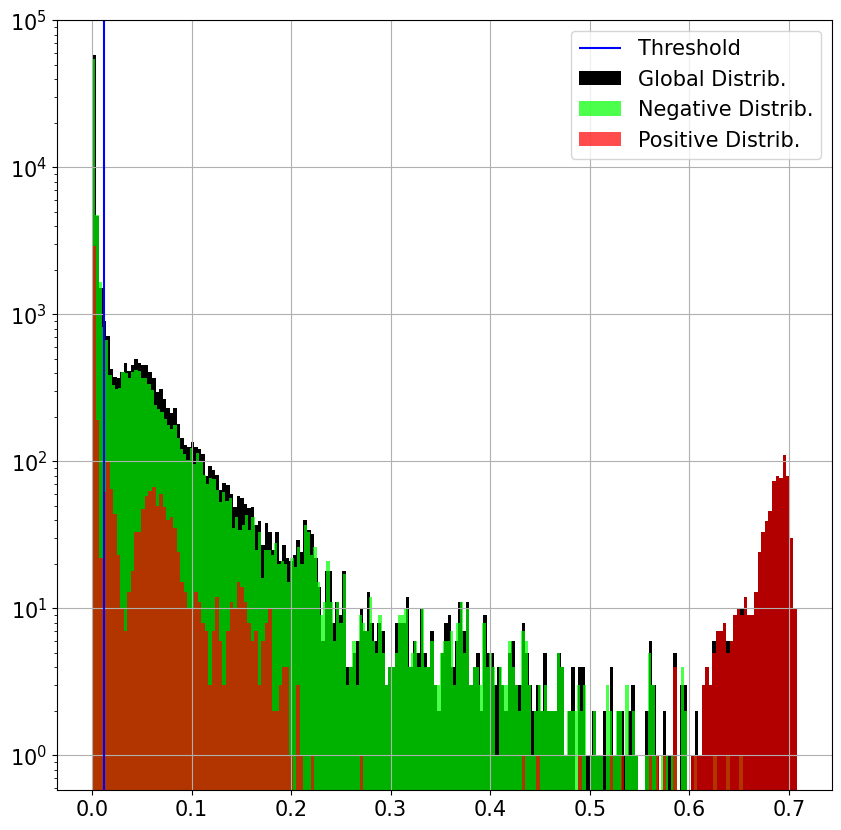

In [40]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

In [41]:
! rm -r  drive/MyDrive/HPCDATA/multigraph2
! cp -r out drive/MyDrive/HPCDATA/multigraph2

rm: cannot remove 'drive/MyDrive/HPCDATA/multigraph2': No such file or directory
